# CatBoost Regression for Perovskite Stability Prediction

In [69]:
%pip install catboost

In [70]:
import pandas as pd
from google.colab import drive

# Load Google Drive
drive.mount('/content/drive')

# Read file
file_path = '/content/drive/MyDrive/MSE544/Perovskite_Stability_with_features.csv'
try:
    df = pd.read_csv(file_path)
    print("Successful")
except FileNotFoundError:
    print(f"Error! check routs:{file_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Successful


In [71]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [72]:
from google.colab import ai

In [73]:
df.shape

(1929, 81)

In [74]:
df.head()

,Material Composition,A site #1,A site #2,A site #3,B site #1,B site #2,B site #3,X site,Number of elements,energy_above_hull (meV/atom),...,host_Asite0_IsBCC,host_Asite0_IsCubic,host_Asite0_IsAlkali,host_Asite0_OrbitalD,host_Asite0_NsValence,host_Bsite0_At. #,host_Bsite0_IsHexagonal,host_Bsite0_IsNoblegas,Asite_IsAlkali_max,Bsite_IsMetal_max
0,Ba1Sr7V8O24,Ba,Sr,NaN,V,NaN,NaN,O,4,29.747707,...,0,0,0,0,2,23,0,0,1,1
1,Ba2Bi2Pr4Co8O24,Ba,Bi,Pr,Co,NaN,NaN,O,5,106.702335,...,0,0,0,0,2,27,1,0,1,1
2,Ba2Ca6Fe8O24,Ba,Ca,NaN,Fe,NaN,NaN,O,4,171.608093,...,0,0,0,0,2,26,0,0,1,1
3,Ba2Cd2Pr4Ni8O24,Ba,Cd,Pr,Ni,NaN,NaN,O,5,284.898190,...,0,0,0,0,2,28,0,0,1,1
4,Ba2Dy6Fe8O24,Ba,Dy,NaN,Fe,NaN,NaN,O,4,270.007913,...,0,0,0,0,2,26,0,0,1,1


In [75]:
df.iloc[:, 1:7] = df.iloc[:, 1:7].fillna('None')

In [76]:
import catboost

In [77]:
df = df.drop(['Material Composition'],axis=1)
X = df.drop(['energy_above_hull (meV/atom)'], axis=1)
y = df['energy_above_hull (meV/atom)']

In [78]:
from sklearn.model_selection import train_test_split

In [79]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.25, random_state=42
)

In [80]:
cat_features = list(range(0,7))

0:	learn: 97.0879365	test: 94.6304580	best: 94.6304580 (0)	total: 18.7ms	remaining: 18.7s
100:	learn: 65.6153408	test: 64.6691210	best: 64.6691210 (100)	total: 3.15s	remaining: 28s
200:	learn: 54.2668309	test: 55.8097655	best: 55.8097655 (200)	total: 5.88s	remaining: 23.4s
300:	learn: 48.5625349	test: 51.4987298	best: 51.4987298 (300)	total: 8.75s	remaining: 20.3s
400:	learn: 45.0992831	test: 49.2163278	best: 49.2163278 (400)	total: 12.6s	remaining: 18.8s
500:	learn: 42.5283283	test: 47.3229828	best: 47.3229828 (500)	total: 13.6s	remaining: 13.5s
600:	learn: 40.5544439	test: 45.7558340	best: 45.7558340 (600)	total: 14.2s	remaining: 9.43s
700:	learn: 39.0602276	test: 44.6202311	best: 44.6202311 (700)	total: 14.8s	remaining: 6.3s
800:	learn: 37.7740691	test: 43.9657265	best: 43.9657265 (800)	total: 15.4s	remaining: 3.82s
900:	learn: 36.7086143	test: 43.2738224	best: 43.2547880 (899)	total: 16s	remaining: 1.75s
999:	learn: 35.6779749	test: 42.6248509	best: 42.6202277 (998)	total: 16.6s	re

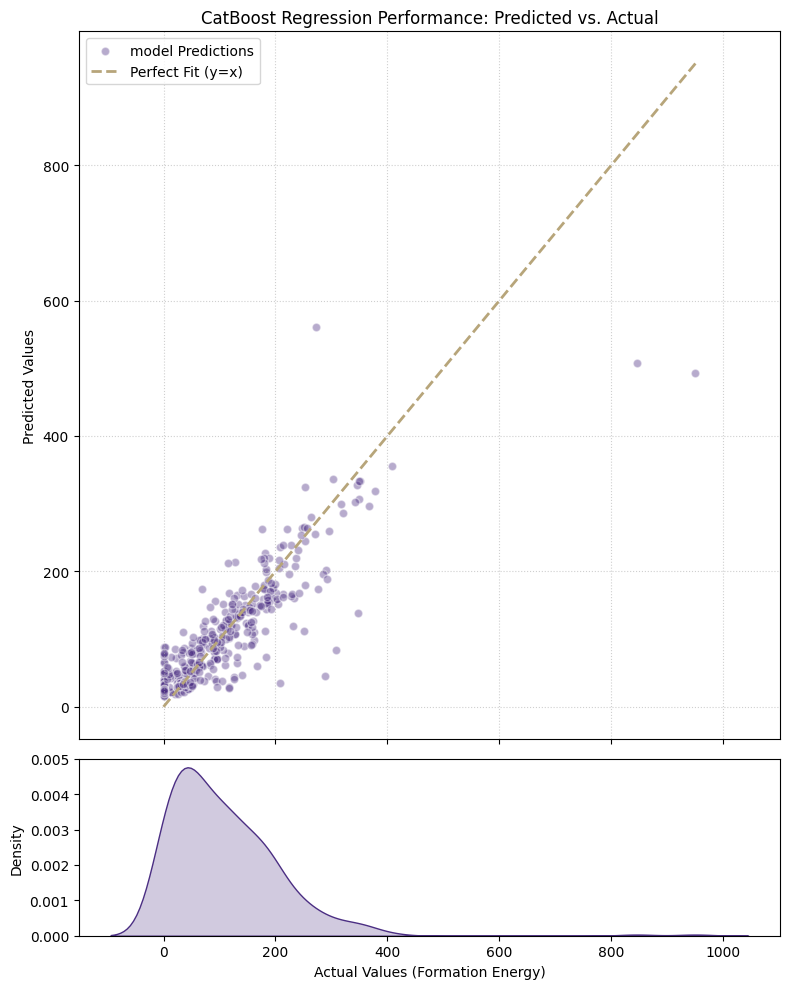

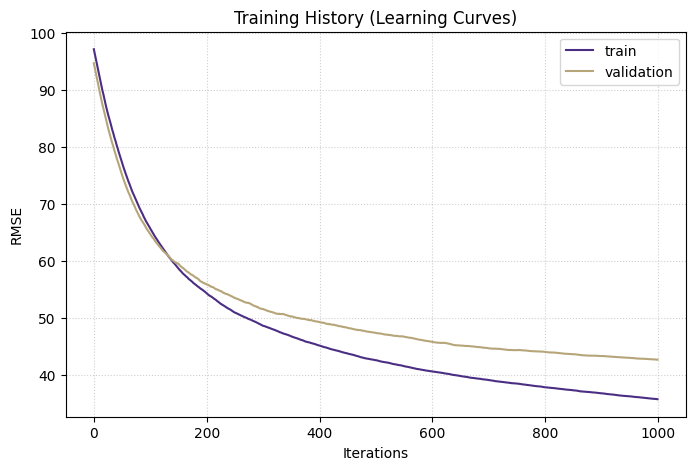

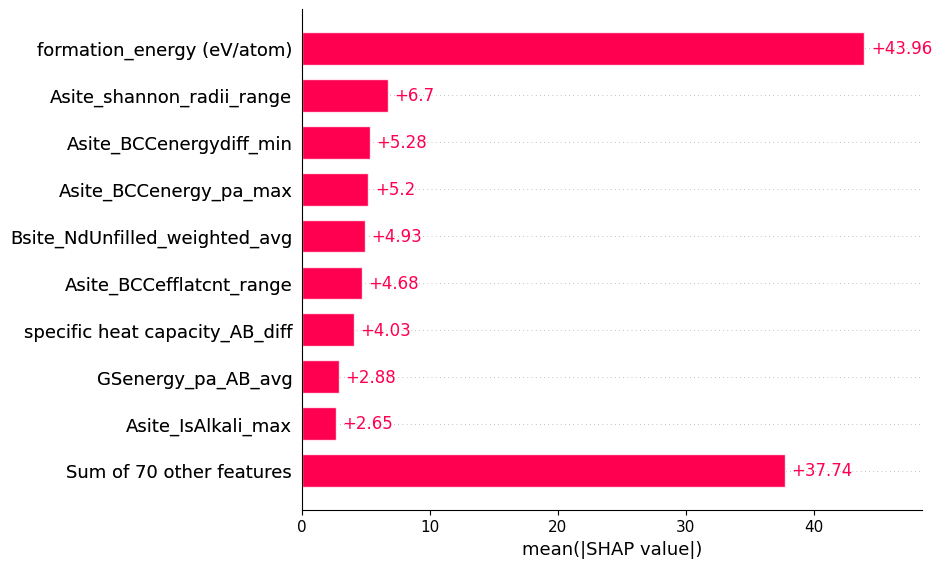

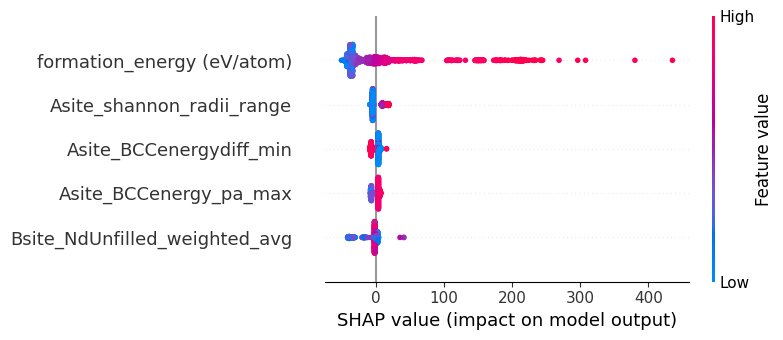

In [81]:
# model1: 3, 1000, 0.01, 1
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. INITIALIZE model1
params = {"depth": 3,
          "iterations": 1000,
          "learning_rate": 0.01,
          "l2_leaf_reg": 1,
          "verbose": 100,
          "task_type": "GPU",
          "one_hot_max_size": 50, # controls when categorical features are one-hot encoded vs target-encoded
          "loss_function": "RMSE",
          "cat_features": cat_features}
model1 = catboost.CatBoostRegressor(**params)

# 2. TRAIN AND PREDICT
# We only need to .fit() once to get both predictions and scores
model1.fit(X_train, y_train, eval_set=(X_val, y_val))
y_pred = model1.predict(X_test)

# 3. PARITY PLOT (Actual vs. Predicted)
fig1, (ax_scatter, ax_kde) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                                         gridspec_kw={'height_ratios': [4, 1]})

ax_scatter.scatter(y_test, y_pred, alpha=0.4, edgecolors='w', color='#4b2e83', label='model Predictions')
mn = min(y_test.min(), y_pred.min())
mx = max(y_test.max(), y_pred.max())
ax_scatter.plot([mn, mx], [mn, mx], color='#b7a57a', linestyle='--', lw=2, label='Perfect Fit (y=x)')
ax_scatter.set_ylabel('Predicted Values')
ax_scatter.set_title('CatBoost Regression Performance: Predicted vs. Actual')
ax_scatter.legend()
ax_scatter.grid(True, linestyle=':', alpha=0.6)

sns.kdeplot(y_test, ax=ax_kde, fill=True, color='#4b2e83')
ax_kde.set_xlabel('Actual Values (Formation Energy)')
ax_kde.set_ylabel('Density')
plt.tight_layout()
plt.show()

# 4. LEARNING CURVES (Training vs. Validation)
plt.figure(figsize=(8, 5))
scores = model1.get_evals_result()
plt.plot(scores['learn']['RMSE'], label='train', color='#4b2e83')
plt.plot(scores['validation']['RMSE'], label='validation', color='#b7a57a')
plt.title('Training History (Learning Curves)')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

#5. Contribution of each feature
import shap
explainer = shap.Explainer(model1)
shap_values = explainer(X_train)
shap.plots.bar(shap_values)

#6. Contribution of each feature: Positive & Negative
shap.summary_plot(shap_values, max_display=5)

#7. Calculate Feature Statistics (Section1)
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [82]:
#7. Calculate Feature Statistics (Section2)
enable_plotly_in_cell()
feature = 'Asite_BCCefflatcnt_range'
x = model1.calc_feature_statistics(X, y, feature, plot=True)

0:	learn: 91.6025149	test: 89.3401110	best: 89.3401110 (0)	total: 45.5ms	remaining: 45.5s
100:	learn: 28.8446424	test: 41.0438679	best: 41.0438679 (100)	total: 1.48s	remaining: 13.2s
200:	learn: 24.4661088	test: 39.0922501	best: 39.0922501 (200)	total: 2.49s	remaining: 9.9s
300:	learn: 22.5466265	test: 38.4892363	best: 38.4892363 (300)	total: 3.51s	remaining: 8.15s
400:	learn: 21.4820733	test: 37.8166531	best: 37.8160259 (399)	total: 4.67s	remaining: 6.97s
500:	learn: 20.3657726	test: 37.4141851	best: 37.3837252 (491)	total: 7.22s	remaining: 7.19s
600:	learn: 19.1889839	test: 36.9642034	best: 36.9535707 (594)	total: 9.04s	remaining: 6s
700:	learn: 18.2149153	test: 36.6373014	best: 36.6311811 (688)	total: 10s	remaining: 4.27s
800:	learn: 17.5982142	test: 36.4773201	best: 36.4773201 (800)	total: 11s	remaining: 2.73s
900:	learn: 17.1769345	test: 36.3864793	best: 36.3768205 (897)	total: 12s	remaining: 1.32s
999:	learn: 16.7471335	test: 36.2983140	best: 36.2935441 (996)	total: 13s	remaining

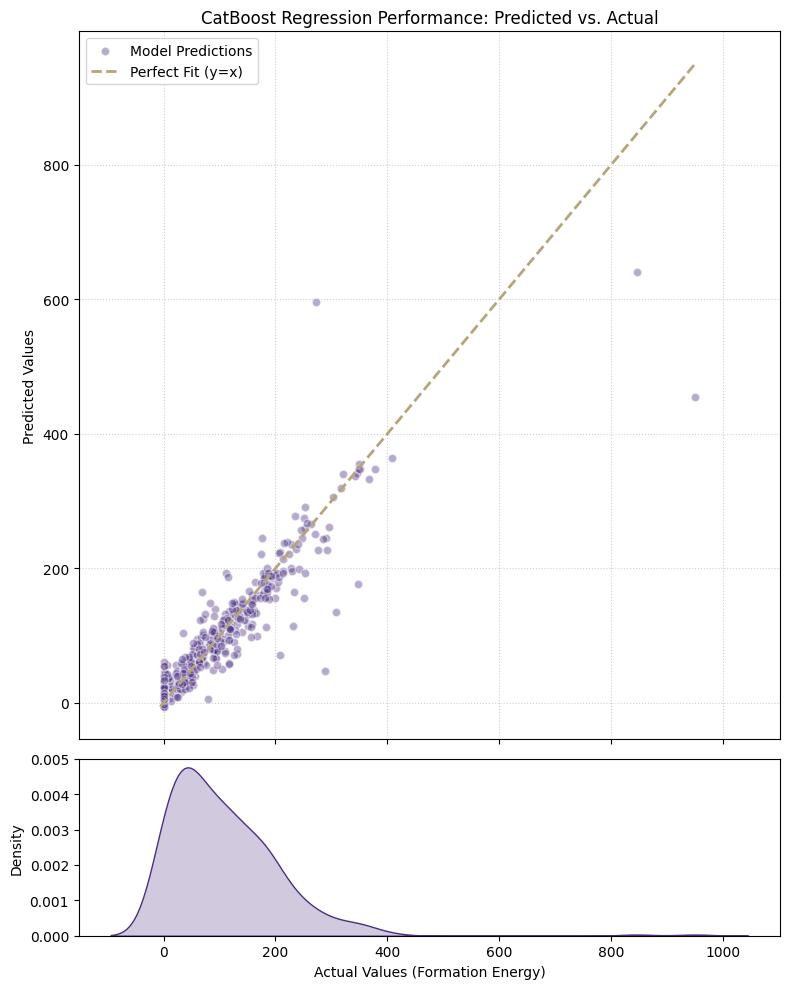

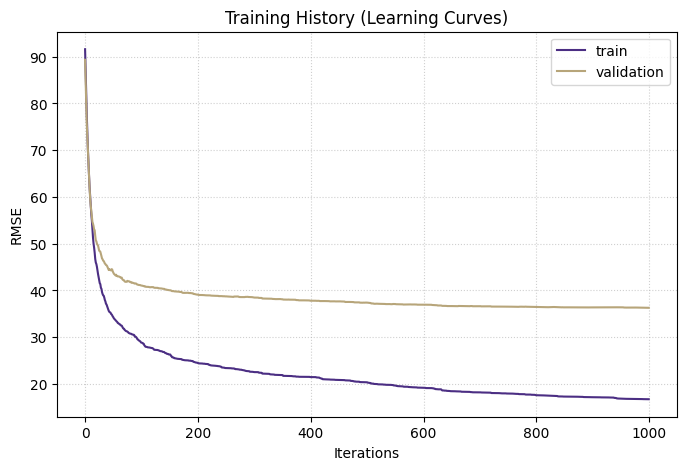

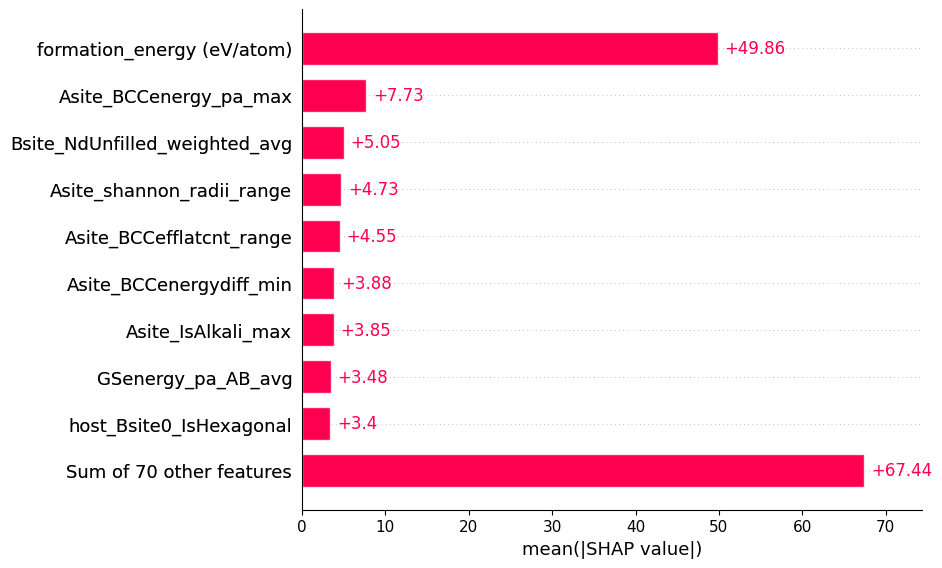

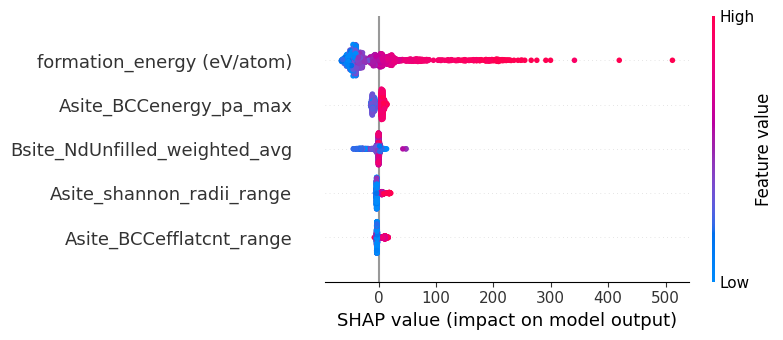

In [83]:
# model2: 6, 1000, 0.1, 1
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. INITIALIZE model2
params = {"depth": 6,
          "iterations": 1000,
          "learning_rate": 0.1,
          "l2_leaf_reg": 1,
          "verbose": 100,
          "task_type": "GPU",
          "one_hot_max_size": 50, # controls when categorical features are one-hot encoded vs target-encoded
          "loss_function": "RMSE",
          "cat_features": cat_features}
model2 = catboost.CatBoostRegressor(**params)

# 2. TRAIN AND PREDICT
# We only need to .fit() once to get both predictions and scores
model2.fit(X_train, y_train, eval_set=(X_val, y_val))
y_pred = model2.predict(X_test)

# 3. PARITY PLOT (Actual vs. Predicted)
fig1, (ax_scatter, ax_kde) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                                         gridspec_kw={'height_ratios': [4, 1]})

ax_scatter.scatter(y_test, y_pred, alpha=0.4, edgecolors='w', color='#4b2e83', label='Model Predictions')
mn = min(y_test.min(), y_pred.min())
mx = max(y_test.max(), y_pred.max())
ax_scatter.plot([mn, mx], [mn, mx], color='#b7a57a', linestyle='--', lw=2, label='Perfect Fit (y=x)')
ax_scatter.set_ylabel('Predicted Values')
ax_scatter.set_title('CatBoost Regression Performance: Predicted vs. Actual')
ax_scatter.legend()
ax_scatter.grid(True, linestyle=':', alpha=0.6)

sns.kdeplot(y_test, ax=ax_kde, fill=True, color='#4b2e83')
ax_kde.set_xlabel('Actual Values (Formation Energy)')
ax_kde.set_ylabel('Density')
plt.tight_layout()
plt.show()

# 4. LEARNING CURVES (Training vs. Validation)
plt.figure(figsize=(8, 5))
scores = model2.get_evals_result()
plt.plot(scores['learn']['RMSE'], label='train', color='#4b2e83')
plt.plot(scores['validation']['RMSE'], label='validation', color='#b7a57a')
plt.title('Training History (Learning Curves)')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

#5. Contribution of each feature
import shap
explainer = shap.Explainer(model2)
shap_values = explainer(X_train)
shap.plots.bar(shap_values)

#6. Contribution of each feature: Positive & Negative
shap.summary_plot(shap_values, max_display=5)

#7. Calculate Feature Statistics (Section1)
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [84]:
#7. Calculate Feature Statistics (Section2)
enable_plotly_in_cell()
feature = 'Asite_BCCefflatcnt_range'
x = model2.calc_feature_statistics(X, y, feature, plot=True)

0:	learn: 93.1278941	test: 90.6426752	best: 90.6426752 (0)	total: 32.3ms	remaining: 32.3s
100:	learn: 40.7894850	test: 45.4956405	best: 45.4956405 (100)	total: 1.63s	remaining: 14.5s
200:	learn: 32.4216761	test: 42.8841598	best: 42.8841598 (200)	total: 2.6s	remaining: 10.3s
300:	learn: 28.7975894	test: 41.5215469	best: 41.5215469 (300)	total: 4.87s	remaining: 11.3s
400:	learn: 26.2830707	test: 40.2897637	best: 40.2897637 (400)	total: 7.42s	remaining: 11.1s
500:	learn: 24.7943334	test: 39.6869938	best: 39.6861452 (499)	total: 8.39s	remaining: 8.36s
600:	learn: 23.4557950	test: 39.1026905	best: 39.0897524 (598)	total: 9.36s	remaining: 6.21s
700:	learn: 22.4541897	test: 38.7644215	best: 38.7644215 (700)	total: 10.3s	remaining: 4.41s
800:	learn: 21.5508434	test: 38.3254763	best: 38.3122060 (798)	total: 11.3s	remaining: 2.81s
900:	learn: 20.3641572	test: 37.6346374	best: 37.6346374 (900)	total: 12.3s	remaining: 1.35s
999:	learn: 19.6345336	test: 37.1649235	best: 37.1649235 (999)	total: 13.3

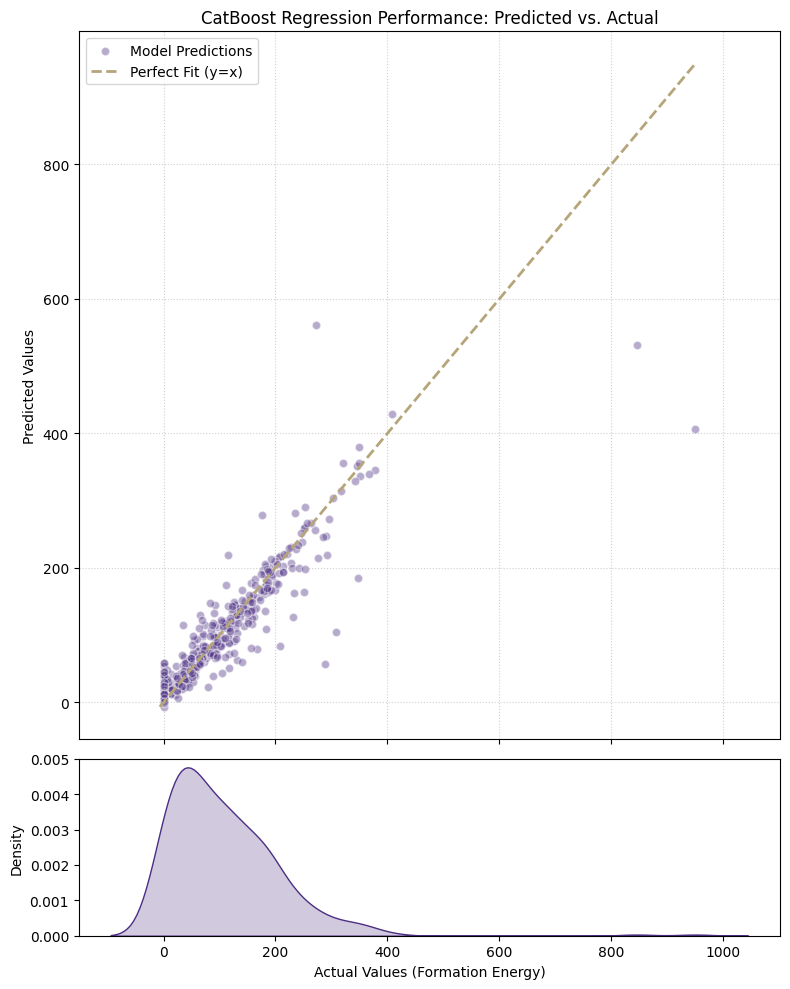

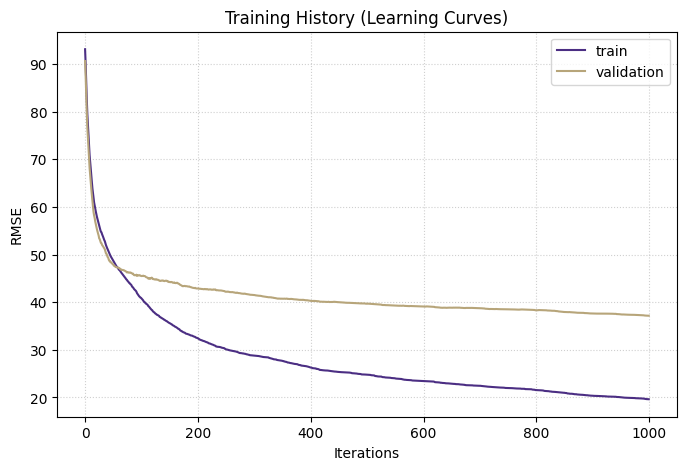

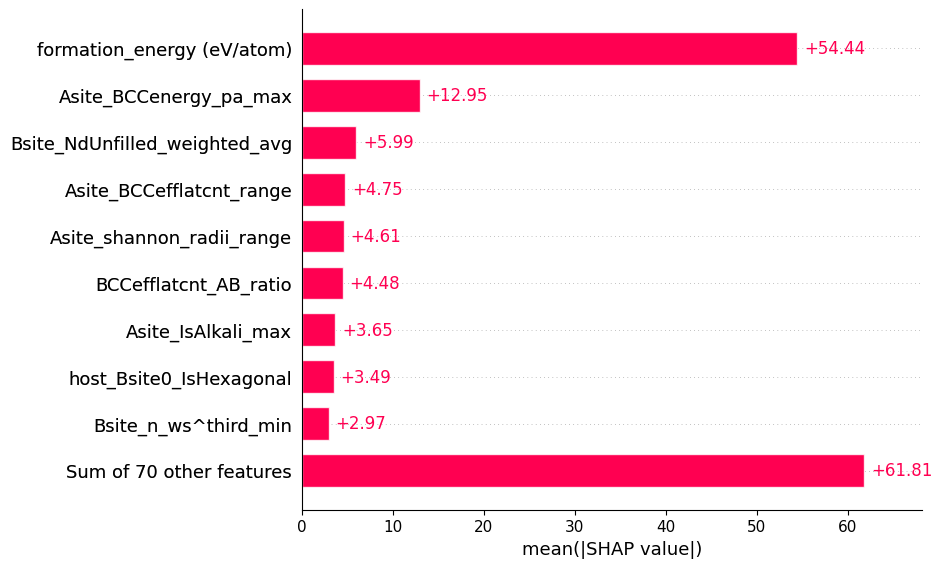

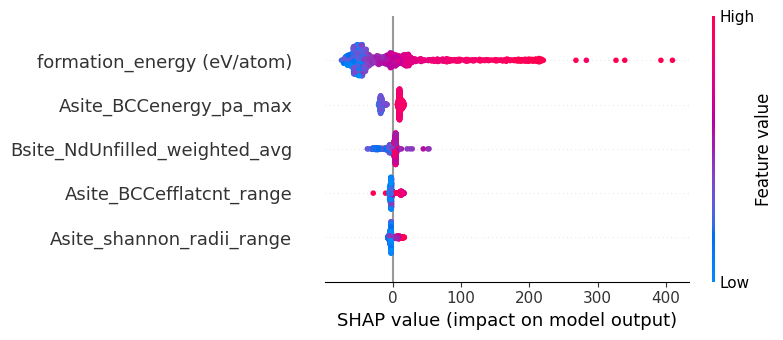

In [85]:
# model3: 6, 1000, 0.1, 30
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. INITIALIZE model3
params = {"depth": 6,
          "iterations": 1000,
          "learning_rate": 0.1,
          "l2_leaf_reg": 30,
          "verbose": 100,
          "task_type": "GPU",
          "one_hot_max_size": 50, # controls when categorical features are one-hot encoded vs target-encoded
          "loss_function": "RMSE",
          "cat_features": cat_features}
model3 = catboost.CatBoostRegressor(**params)

# 2. TRAIN AND PREDICT
# We only need to .fit() once to get both predictions and scores
model3.fit(X_train, y_train, eval_set=(X_val, y_val))
y_pred = model3.predict(X_test)

# 3. PARITY PLOT (Actual vs. Predicted)
fig1, (ax_scatter, ax_kde) = plt.subplots(2, 1, figsize=(8, 10), sharex=True,
                                         gridspec_kw={'height_ratios': [4, 1]})

ax_scatter.scatter(y_test, y_pred, alpha=0.4, edgecolors='w', color='#4b2e83', label='Model Predictions')
mn = min(y_test.min(), y_pred.min())
mx = max(y_test.max(), y_pred.max())
ax_scatter.plot([mn, mx], [mn, mx], color='#b7a57a', linestyle='--', lw=2, label='Perfect Fit (y=x)')
ax_scatter.set_ylabel('Predicted Values')
ax_scatter.set_title('CatBoost Regression Performance: Predicted vs. Actual')
ax_scatter.legend()
ax_scatter.grid(True, linestyle=':', alpha=0.6)

sns.kdeplot(y_test, ax=ax_kde, fill=True, color='#4b2e83')
ax_kde.set_xlabel('Actual Values (Formation Energy)')
ax_kde.set_ylabel('Density')
plt.tight_layout()
plt.show()

# 4. LEARNING CURVES (Training vs. Validation)
plt.figure(figsize=(8, 5))
scores = model3.get_evals_result()
plt.plot(scores['learn']['RMSE'], label='train', color='#4b2e83')
plt.plot(scores['validation']['RMSE'], label='validation', color='#b7a57a')
plt.title('Training History (Learning Curves)')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

#5. Contribution of each feature
import shap
explainer = shap.Explainer(model3)
shap_values = explainer(X_train)
shap.plots.bar(shap_values)

#6. Contribution of each feature: Positive & Negative
shap.summary_plot(shap_values, max_display=5)

#7. Calculate Feature Statistics (Section1)
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [86]:
#7. Calculate Feature Statistics (Section2)
enable_plotly_in_cell()
feature = 'Asite_BCCefflatcnt_range'
x = model3.calc_feature_statistics(X, y, feature, plot=True)